# <center> <img src="figs/LogoUFSCar.jpg" alt="Logo UFScar" width="110" align="left"/>  <br/> <center>Universidade Federal de São Carlos (UFSCar)<br/><font size="4"> Departamento de Computação, campus Sorocaba</center></font>
</p>

<font size="4"><center><b>Disciplina: Aprendizado de Máquina</b></center></font>
  
<font size="3"><center>Prof. Dr. Tiago A. Almeida</center></font>

## <center>Projeto Final</center>

**Nome**: Anderson Cristiano Sassaki Gonçalves e Lorenzo Grippo Chiachio

**RA**: 821675 e 823917


---
### Análise exploratória

Nesta seção, deve ser feita a leitura da base de dados e todas as análises necessárias para interpretar e analisar os dados, tais como:
* Significado de cada atributo
* Medidas descritivas
* Gráficos

Inicalmente, carregaremos o arquivo com os dados de treinamento com o auxílio da biblioteca pandas. Caso os dados sejam carregados, exibiremos as 10 primeiras amostras do arquivo:

In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

TRAIN_CSV_PATH = 'dataset/train.csv'

try:
    df_train = pd.read_csv(TRAIN_CSV_PATH)
    print("Arquivo train.csv carregado com sucesso!")

    print("\nPrimeiras 10 amostras do conjunto de treino:")
    display(df_train.head(n=10))

except FileNotFoundError:
    print(f"Erro: Arquivo {TRAIN_CSV_PATH} não encontrado. Verifique a estrutura das pastas.")

In [ ]:
dataset = df_train.values
display(df_train.head(n=6))

In [ ]:
print("Informações gerais do DataFrame de treino:")
df_train.info()

Em seguida, verificamos a distribuição das classes nas amostras de treino. Uma distribuição desbalanceada gera alguns alertas para o andamento do projeto.

In [ ]:
label_counts = df_train['Label'].value_counts()

# 2. Plotar o gráfico de barras
plt.figure(figsize=(10, 6))

# Cria o gráfico de barras
label_counts.plot(kind='bar', color=['skyblue', 'salmon', 'lightgreen'])

# Adiciona título e rótulos
plt.title('Distribuição da Contagem de Labels (Categorias)')
plt.xlabel('Tipo de Label')
plt.ylabel('Contagem (Frequência)')
plt.xticks(rotation=0) # Mantém os nomes das labels na horizontal

# Adiciona o valor exato no topo de cada barra (anotação)
for index, value in enumerate(label_counts):
    plt.text(index, value + 0.5, str(value), ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Felizmente, as amostras estão bem distribuídas entre STRESS, ANAEROBIC e AEROBIC.

Seguindo com os testes, fazemos uma verificação rápida para garantir que todos as amostras do conjunto de treinamento tenham um rótulo que não seja nulo ou inválido:

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Supondo que df_train foi carregado na seção anterior
# df_train = pd.read_csv('dataset/train.csv')

# Soma a quantidade de valores nulos por coluna
missing_labels = df_train.isnull().sum()

print("Contagem de valores ausentes por coluna em train.csv:")
print(missing_labels)

if missing_labels.sum() == 0:
    print("\nConclusão: Excelente! Não há valores ausentes no arquivo de rótulos (train.csv).")
else:
    print("\nAtenção: Foram encontrados valores ausentes no arquivo de rótulos.")

Seguindo o mesmo raciocinio, verificamos se todas as amostras possuem arquivos de medição com valores nulos ou que não são vazios.

In [ ]:
import pandas as pd
import os
from tqdm import tqdm

# Lista de sensores a serem verificados
sensors_to_check = ['HR', 'EDA', 'TEMP', 'BVP', 'ACC', 'IBI']
# Dicionário para armazenar informações sobre dados ausentes
missing_data_report = {}

print("Iniciando verificação de valores ausentes nos arquivos de sensores...")

# Itera por cada amostra no nosso conjunto de treino
for user_id in tqdm(df_train['Id']):
    missing_files = []
    empty_files = []
    nan_in_files = {}

    # Itera por cada tipo de sensor para o usuário atual
    for sensor in sensors_to_check:
        file_path = os.path.join('dataset/wearables/', user_id, f'{sensor}.csv')

        # 1. Verifica se o arquivo existe
        if not os.path.exists(file_path):
            missing_files.append(sensor)
            continue

        # 2. Verifica se o arquivo está vazio
        if os.path.getsize(file_path) == 0:
            empty_files.append(sensor)
            continue

        # 3. Verifica se há valores NaN dentro do arquivo
        try:
            df_sensor = pd.read_csv(file_path, header=None)
            if df_sensor.isnull().sum().sum() > 0:
                nan_in_files[sensor] = df_sensor.isnull().sum().sum()
        except pd.errors.EmptyDataError:
            empty_files.append(sensor) # O arquivo pode ter um cabeçalho mas nenhum dado

    # Guarda o relatório para este usuário se algum problema foi encontrado
    if missing_files or empty_files or nan_in_files:
        missing_data_report[user_id] = {
            'Arquivos Ausentes': missing_files,
            'Arquivos Vazios': empty_files,
            'Valores NaN Internos': nan_in_files
        }

# --- Relatório Final ---
print("\nVerificação concluída.")
if not missing_data_report:
    print("\nConclusão: Ótima notícia! Nenhuma amostra de treino possui arquivos de sensores ausentes, vazios ou com valores NaN internos.")
else:
    print("\nAtenção: Foram encontrados problemas de dados ausentes em algumas amostras:")
    for user_id, report in missing_data_report.items():
        print(f"\nUsuário: {user_id}")
        if report['Arquivos Ausentes']: print(f"  - Arquivos Ausentes: {report['Arquivos Ausentes']}")
        if report['Arquivos Vazios']: print(f"  - Arquivos Vazios: {report['Arquivos Vazios']}")
        if report['Valores NaN Internos']: print(f"  - Valores NaN Internos: {report['Valores NaN Internos']}")

Infelizmente a amostra U_89740 não tem nenhuma medição registrada no seu arquivo IBI, o que precisa ser tratado na próxima fase do projeto.

Abaixo realizamos uma inspeção visual simples, selecionando uma amostra aleatória de cada classe e plotando suas 6 medições. Fazendo isso buscamos entender se existe algum padrão muito óbvio que nos ajude a separar as classes. Por sorte, nesta etapa identificamos algumas amostras aleatórias com valores absurdos, como temperatura de 200C ou frequencia cardiaca de 1000BPM. Esses outliers serão tratados na fase de pré processamento. Além disso, realizaremos outras análises mais a frente, com o objetivo de encontrar outliers de forma mais assertiva.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np

# --- 1. CONFIGURAÇÃO E SELEÇÃO ALEATÓRIA DE USUÁRIOS ---

# Carrega o arquivo de treino para saber quais usuários pertencem a cada classe
df_labels = pd.read_csv('dataset/train.csv')

# Define os sensores que você quer visualizar na grade
sensors_to_plot = ['HR', 'EDA', 'TEMP', 'BVP', 'ACC', 'IBI']

# Dicionário para armazenar os IDs selecionados aleatoriamente
class_examples = {}
class_names = df_labels['Label'].unique() # Pega as classes diretamente do arquivo

# Itera por cada classe para sortear um usuário
for class_name in class_names:
    # Filtra todos os IDs pertencentes à classe atual
    ids_for_class = df_labels[df_labels['Label'] == class_name]['Id']
    # Sorteia um ID da lista
    random_id = ids_for_class.sample(n=1).iloc[0]
    # Adiciona o ID sorteado ao dicionário
    class_examples[class_name] = random_id

print(f"Usuários selecionados aleatoriamente para esta visualização: {class_examples}")

# --- 2. CRIAÇÃO DA GRADE DE GRÁFICOS ---

# Cria uma figura e uma grade de subplots.
# A altura da figura agora se ajusta automaticamente ao número de sensores
fig, axes = plt.subplots(nrows=len(sensors_to_plot), ncols=len(class_names),
                         figsize=(20, 5 * len(sensors_to_plot)),
                         sharey='row')

print("\nGerando grade de visualização dos sinais (com escalas e usuários aleatórios)...")

# Itera por cada SENSOR (que será uma LINHA no grid)
for row_idx, sensor in enumerate(sensors_to_plot):
    # Itera por cada CLASSE (que será uma COLUNA no grid)
    for col_idx, class_name in enumerate(class_names):

        ax = axes[row_idx, col_idx]
        user_id = class_examples[class_name]
        file_path = f'dataset/wearables/{user_id}/{sensor}.csv'

        try:
            # Lógica de leitura e plotagem específica para cada sensor
            if sensor == 'ACC':
                df_signal = pd.read_csv(file_path, header=None, skiprows=1, names=['X', 'Y', 'Z'])
                ax.plot(df_signal.index, df_signal['X'], label='Eixo X', linewidth=1)
                ax.plot(df_signal.index, df_signal['Y'], label='Eixo Y', linewidth=1)
                ax.plot(df_signal.index, df_signal['Z'], label='Eixo Z', linewidth=1)
                ax.legend(fontsize='small')

            elif sensor == 'IBI':
                df_signal = pd.read_csv(file_path, header=None, names=['Timestamp', 'Interval'])
                df_signal['Interval'] = pd.to_numeric(df_signal['Interval'], errors='coerce').dropna()
                ax.plot(df_signal.index, df_signal['Interval'])

            else: # HR, EDA, TEMP, BVP
                df_signal = pd.read_csv(file_path, header=None, skiprows=1)
                ax.plot(df_signal.index, df_signal.values)

        except (FileNotFoundError, pd.errors.EmptyDataError):
            ax.text(0.5, 0.5, 'Dados não encontrados', ha='center', va='center')

        # --- Formatação dos Gráficos ---
        ax.grid(True, linestyle='--', alpha=0.6)

        if row_idx == 0:
            ax.set_title(class_name, fontsize=16, weight='bold')

        if col_idx == 0:
            ax.set_ylabel(sensor, fontsize=14, weight='bold')

        if row_idx == len(sensors_to_plot) - 1:
            ax.set_xlabel('Amostras (Tempo)')

# --- 3. FINALIZAÇÃO E EXIBIÇÃO ---
plt.suptitle('Comparação Visual dos Sinais dos Sensores por Classe (Amostras Aleatórias)', fontsize=24, y=1.0)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

Em seguida, realizaremos uma visualizacao das 6 medições capturadas para cada uma das amostras, separando por classe. Os gráficos gerados serão salvos na pasta figs/analise_atributos.

In [ ]:
import pandas as pd
import sys

sys.path.append('scripts')
from analise_exploratoria import plot_signal_distribution_for_class

try:
    df_train = pd.read_csv('dataset/train.csv')
    print("Dataset de treino carregado.")
except FileNotFoundError:
    print("Erro: dataset/train.csv não encontrado. A função não pode ser executada.")
    df_train = None

if df_train is not None:
    ## Plotando medições de TEMP
    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='TEMP.csv',
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='TEMP.csv',
        cols=4,
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='TEMP.csv',
        cols=4,
        save_fig=True
    )

    ## Plotando medições de HR
    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='HR.csv',
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='HR.csv',
        cols=4,
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='HR.csv',
        cols=4,
        save_fig=True
    )

    ## Plotando medições de EDA
    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='EDA.csv',
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='EDA.csv',
        cols=4,
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='EDA.csv',
        cols=4,
        save_fig=True
    )

    ## Plotando medições de BVP
    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='BVP.csv',
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='BVP.csv',
        cols=4,
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='BVP.csv',
        cols=4,
        save_fig=True
    )

    ## Plotando medições de ACC
    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='ACC.csv',
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='ACC.csv',
        cols=4,
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='ACC.csv',
        cols=4,
        save_fig=True
    )

    ## Plotando medições de IBI
    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='IBI.csv',
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='IBI.csv',
        cols=4,
        save_fig=True
    )

    plot_signal_distribution_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='IBI.csv',
        cols=4,
        save_fig=True
    )

In [ ]:
import pandas as pd
import sys

sys.path.append('scripts')
from analise_exploratoria import plot_boxplot_comparison_for_class

try:
    df_train = pd.read_csv('dataset/train.csv')
    print("Dataset de treino carregado.")
except FileNotFoundError:
    print("Erro: dataset/train.csv não encontrado. A função não pode ser executada.")
    df_train = None

if df_train is not None:
    ## Plotando medições de TEMP
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='TEMP.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='TEMP.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='TEMP.csv',
        save_fig=True
    )

    ## Plotando medições de HR
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='HR.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='HR.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='HR.csv',
        save_fig=True
    )

    ## Plotando medições de EDA
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='EDA.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='EDA.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='EDA.csv',
        save_fig=True
    )

    ## Plotando medições de BVP
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='BVP.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='BVP.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='BVP.csv',
        save_fig=True
    )

    ## Plotando medições de ACC
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='ACC.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='ACC.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='ACC.csv',
        save_fig=True
    )

    ## Plotando medições de IBI
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='IBI.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='IBI.csv',
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='IBI.csv',
        save_fig=True
    )

Agora, realizaremos uma análise dos dados demográficos contidos no users_info.txt

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

USERS_INFO_PATH = 'dataset/users_info.txt'

try:
    # --- CORREÇÃO APLICADA AQUI ---
    df_users = pd.read_csv(
        USERS_INFO_PATH,
        na_values='-',
        skipfooter=10,               # Ignora as últimas 10 linhas do arquivo
        engine='python'
    )
    # -----------------------------

    print("Arquivo users_info.txt carregado com sucesso, ignorando o rodapé.")

    print("\nInformações gerais do DataFrame de usuários:")
    df_users.info()

    print("\nContagem de valores ausentes por coluna:")
    print(df_users.isnull().sum())

    print("\nPrimeiras 5 linhas do DataFrame carregado:")
    display(df_users.head())

except FileNotFoundError:
    print(f"Erro: {USERS_INFO_PATH} não encontrado.")
except Exception as e:
    print(f"Ocorreu um erro: {e}")

In [ ]:
# Garante que df_users foi carregado
if 'df_users' in locals():
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    fig.suptitle('Perfil Demográfico dos Participantes', fontsize=20)

    # Gráfico 1: Distribuição de Gênero
    sns.countplot(ax=axes[0], x='Gender', data=df_users, palette='viridis', hue='Gender', legend=False)
    axes[0].set_title('Distribuição de Gênero')

    # Gráfico 2: Distribuição de Idade
    sns.histplot(ax=axes[1], data=df_users, x='Age', kde=True, bins=10)
    axes[1].set_title('Distribuição de Idade')

    # Gráfico 3: Prática de Atividade Física
    sns.countplot(ax=axes[2], x='Does physical activity regularly?', data=df_users, palette='magma', hue='Does physical activity regularly?', legend=False)
    axes[2].set_title('Praticantes de Atividade Física')

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [ ]:
# Supondo que df_train foi carregado anteriormente
# df_train = pd.read_csv('dataset/train.csv')

# Junta os dois DataFrames usando 'Id' como chave
df_merged = pd.merge(df_train, df_users, on='Id')

# --- Visualização ---
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle('Distribuição das Classes por Fator Demográfico', fontsize=20)

# Gráfico 1: Distribuição das classes por Gênero
sns.countplot(ax=axes[0], data=df_merged, x='Label', hue='Gender', palette='viridis', order=['STRESS', 'AEROBIC', 'ANAEROBIC'])
axes[0].set_title('Classes por Gênero')

# Gráfico 2: Distribuição das classes por prática de Atividade Física
sns.countplot(ax=axes[1], data=df_merged, x='Label', hue='Does physical activity regularly?', palette='magma', order=['STRESS', 'AEROBIC', 'ANAEROBIC'])
axes[1].set_title('Classes por Prática de Atividade Física')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Com esses gráficos, podemos notar claramente a presença de falhas de medição, com algumas medições registrando mais de 100C. Essas amostras identificadas serão tratadas na fase de pré processamento. Lembrando que a temperatura normal de um ser humano varia na faixa de 36 a 39C, para atividades fisicas, valores menores que isso ou maiores devem ser analisados com atenção pois possivelmente são erros de medição.

---
### Pré-processamento

Nesta seção, as funções da etapa de pré-processamento dos dados devem ser implementadas e aplicadas (se necessário).

Inicialmente, tratamos os valores ausentes detectados na etapa anterior no arquivo de informacoes dos usuarios. Alem disso, tratamos os valores categoricos usando one hot enconding

In [2]:
import sys

sys.path.append('scripts')
from preprocessamento import preprocess_user_info

USERS_INFO_PATH = 'dataset/users_info.txt'
df_users_processed = preprocess_user_info(USERS_INFO_PATH)

if df_users_processed is not None:
    print("\n--- DataFrame Final Processado ---")
    display(df_users_processed.head())
    print("\nVerificação final de valores nulos:")
    print(df_users_processed.isnull().sum().sum())

Função 'preprocess_sensor_file' atualizada com sucesso.
Agora ela calcula a magnitude do acelerômetro (ACC) e a trata como um sinal único.
Arquivo de informações do usuário carregado com sucesso.

--- Iniciando Imputação de Valores Ausentes ---
Coluna numérica 'Age': Valores NaN preenchidos com a média (22.33)
Coluna numérica 'Height (cm)': Valores NaN preenchidos com a média (171.71)
Coluna numérica 'Weight (kg)': Valores NaN preenchidos com a média (69.62)
Coluna qualitativa 'Does physical activity regularly?': Valores NaN preenchidos com a moda ('Yes')
Coluna qualitativa 'Aerobic Exercise': Valores NaN preenchidos com a moda ('Yes')
Coluna qualitativa 'Anaerobic Exercise': Valores NaN preenchidos com a moda ('Yes')

Imputação concluída.

--- Iniciando Codificação e Limpeza Final ---
Coluna 'Does physical activity regularly?' mapeada para 0 e 1.
Colunas ['Gender', 'Protocol'] transformadas com One-Hot Encoding.
Colunas de condição do experimento (['Stress Inducement', 'Aerobic Exerci

,Id,Age,Height (cm),Weight (kg),activity_regularly,Gender_m,Protocol_V2
0,U_21920,22.000000,173.000000,78.000000,1,1,0
1,U_27250,20.000000,185.000000,95.000000,0,1,0
2,U_82422,22.329787,171.712766,69.617021,1,0,1
3,U_35900,21.000000,175.000000,65.000000,1,1,0
4,U_30402,21.000000,174.000000,70.000000,1,1,0



Verificação final de valores nulos:
0


In [3]:
import pandas as pd
import numpy as np
import os
from tqdm import tqdm
import sys

sys.path.append('scripts')
from preprocessamento import preprocess_sensor_file

# Define os diretórios de origem e destino
SOURCE_BASE_DIR = 'dataset/wearables'
DEST_BASE_DIR = 'dataset_processed/wearables'

# Pega a lista de todos os usuários (pastas) do diretório original
try:
    user_ids = [d for d in os.listdir(SOURCE_BASE_DIR) if os.path.isdir(os.path.join(SOURCE_BASE_DIR, d))]
    print(f"Encontrados {len(user_ids)} diretórios de usuários para processar.")
except FileNotFoundError:
    print(f"Erro: Diretório de origem '{SOURCE_BASE_DIR}' não encontrado.")
    user_ids = []

# Lista de sensores a serem processados
sensors = ['HR', 'EDA', 'TEMP', 'BVP', 'ACC', 'IBI']

# Itera por cada usuário e cada sensor para limpar e salvar
if user_ids:
    for user_id in tqdm(user_ids, desc="Processando Usuários"):
        # Cria o diretório de destino para o usuário
        output_user_dir = os.path.join(DEST_BASE_DIR, user_id)
        os.makedirs(output_user_dir, exist_ok=True)

        for sensor in sensors:
            source_file_path = os.path.join(SOURCE_BASE_DIR, user_id, f'{sensor}.csv')
            dest_file_path = os.path.join(output_user_dir, f'{sensor}.csv')

            try:
                # Determina quantas linhas pular no cabeçalho
                skip = 1 if sensor not in ['IBI'] else 0
                df_raw = pd.read_csv(source_file_path, header=None, skiprows=skip)

                # Aplica a função de pré-processamento
                df_clean = preprocess_sensor_file(df_raw, sensor)

                # Salva o arquivo limpo, se ele não estiver vazio
                if df_clean is not None and not df_clean.empty:
                    # Preserva o cabeçalho original (frequência) se houver
                    if skip > 0:
                        with open(source_file_path, 'r') as f:
                            header = f.readline()
                        with open(dest_file_path, 'w') as f:
                            f.write(header)
                        df_clean.to_csv(dest_file_path, index=False, header=False, mode='a')
                    else: # Para IBI, que não tem cabeçalho
                        df_clean.to_csv(dest_file_path, index=False, header=False)

            except (FileNotFoundError, pd.errors.EmptyDataError):
                # Se o arquivo de origem não existe ou está vazio, não faz nada
                continue

    print("\nPRÉ-PROCESSAMENTO CONCLUÍDO!")
    print(f"Todos os arquivos foram limpos e salvos em '{DEST_BASE_DIR}'.")

Encontrados 100 diretórios de usuários para processar.


Processando Usuários:   0%|          | 0/100 [00:00<?, ?it/s]/Users/andersongoncalves/Documents/SDUWPS/scripts/preprocessamento.py:100: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  processed_df.interpolate(method='linear', limit_direction='both', inplace=True)
Processando Usuários:   1%|          | 1/100 [00:00<00:13,  7.36it/s]/Users/andersongoncalves/Documents/SDUWPS/scripts/preprocessamento.py:100: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  processed_df.interpolate(method='linear', limit_direction='both', inplace=True)
Processando Usuários:   2%|▏         | 2/100 [00:00<00:16,  5.80it/s]/Users/andersongoncalves/Documents/SDUWPS/scripts/preprocessamento.py:100: FutureWarning: DataFrame.interpolate with object dtype is deprecated and


PRÉ-PROCESSAMENTO CONCLUÍDO!
Todos os arquivos foram limpos e salvos em 'dataset_processed/wearables'.


Dataset de treino carregado.
Coletando dados do sensor 'TEMP.csv' para 25 amostras da classe 'STRESS'...
Figura salva em 'figs/boxplots/TEMP_stress_boxplots.png'


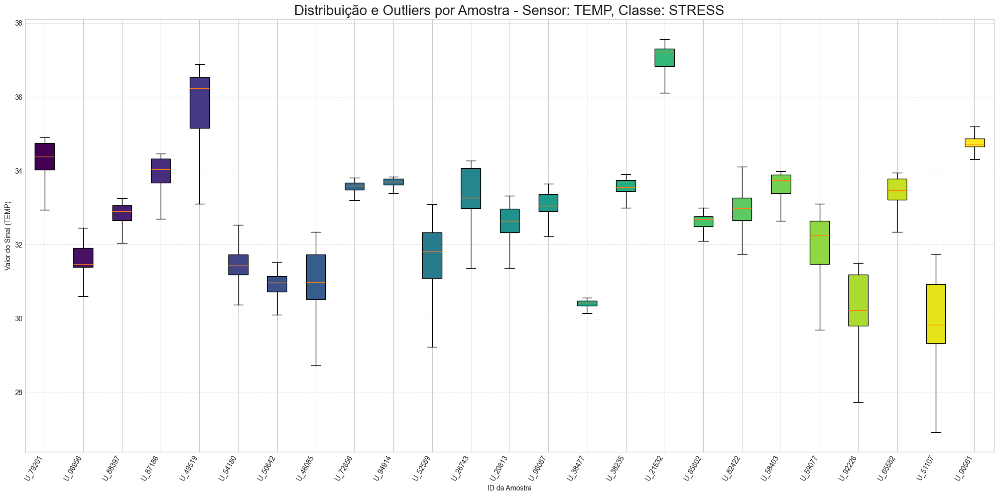


25 box plots gerados para a classe 'STRESS'.
Coletando dados do sensor 'TEMP.csv' para 22 amostras da classe 'AEROBIC'...
Figura salva em 'figs/boxplots/TEMP_aerobic_boxplots.png'


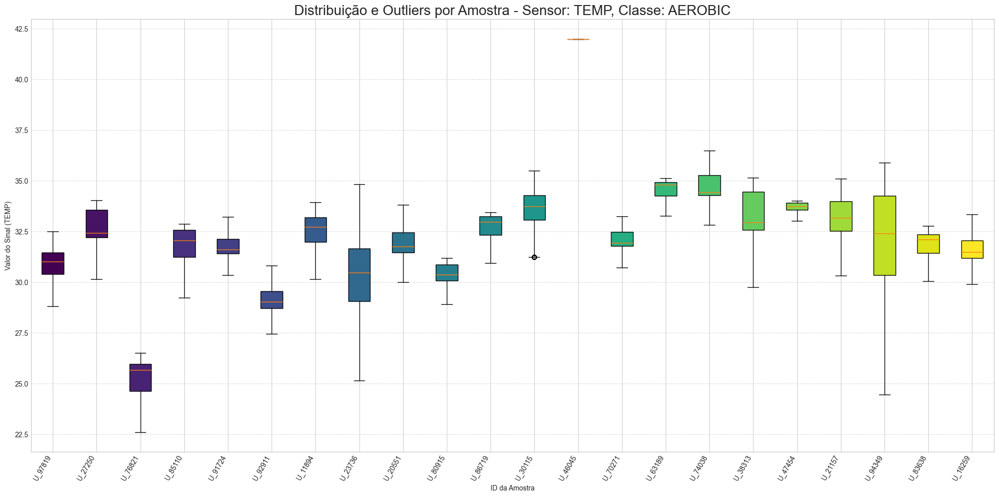


22 box plots gerados para a classe 'AEROBIC'.
Coletando dados do sensor 'TEMP.csv' para 28 amostras da classe 'ANAEROBIC'...
Figura salva em 'figs/boxplots/TEMP_anaerobic_boxplots.png'


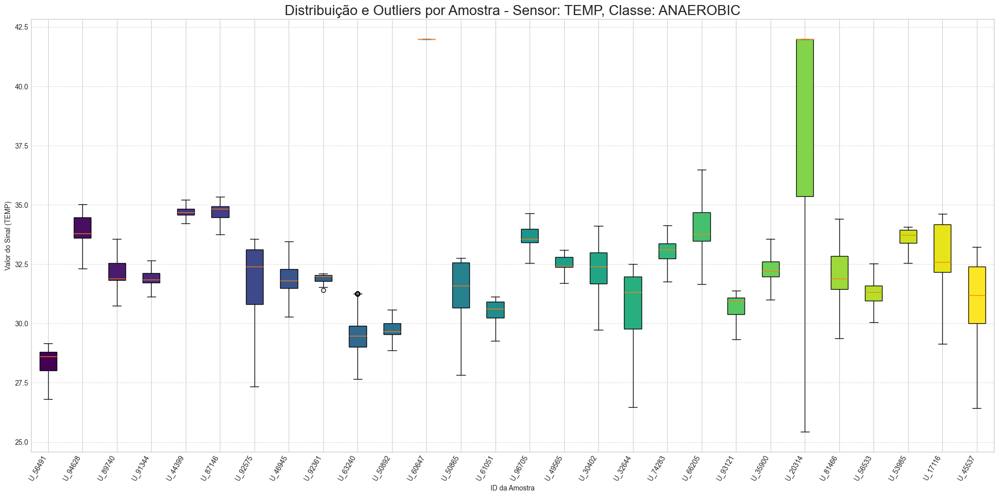


28 box plots gerados para a classe 'ANAEROBIC'.
Coletando dados do sensor 'HR.csv' para 25 amostras da classe 'STRESS'...
Figura salva em 'figs/boxplots/HR_stress_boxplots.png'


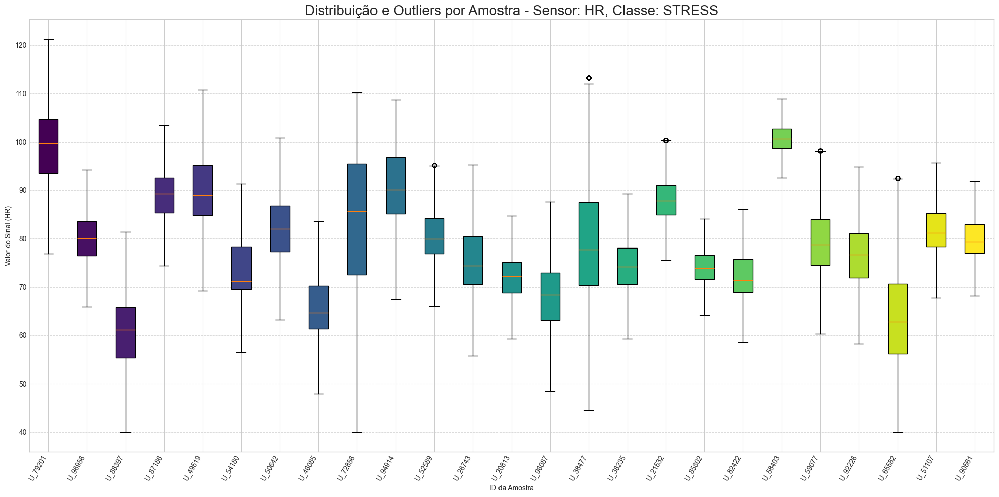


25 box plots gerados para a classe 'STRESS'.
Coletando dados do sensor 'HR.csv' para 22 amostras da classe 'AEROBIC'...
Figura salva em 'figs/boxplots/HR_aerobic_boxplots.png'


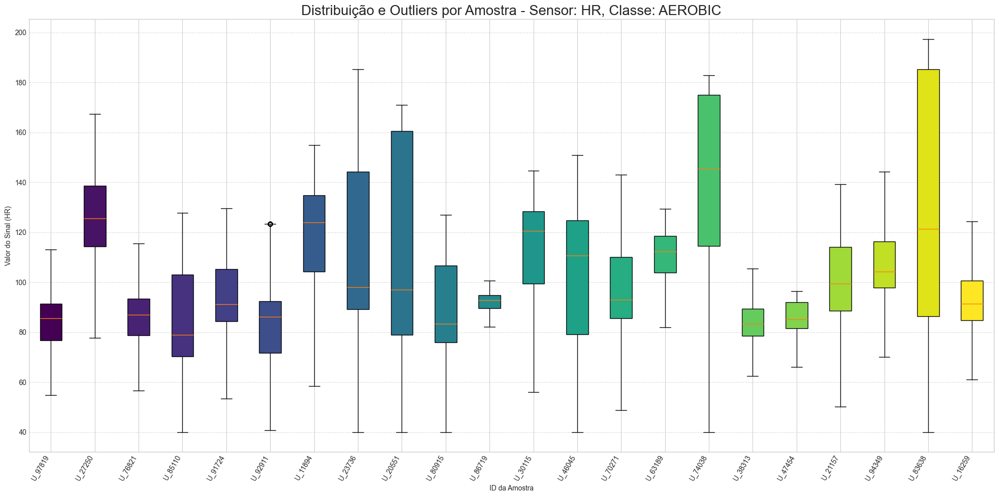


22 box plots gerados para a classe 'AEROBIC'.
Coletando dados do sensor 'HR.csv' para 28 amostras da classe 'ANAEROBIC'...
Figura salva em 'figs/boxplots/HR_anaerobic_boxplots.png'


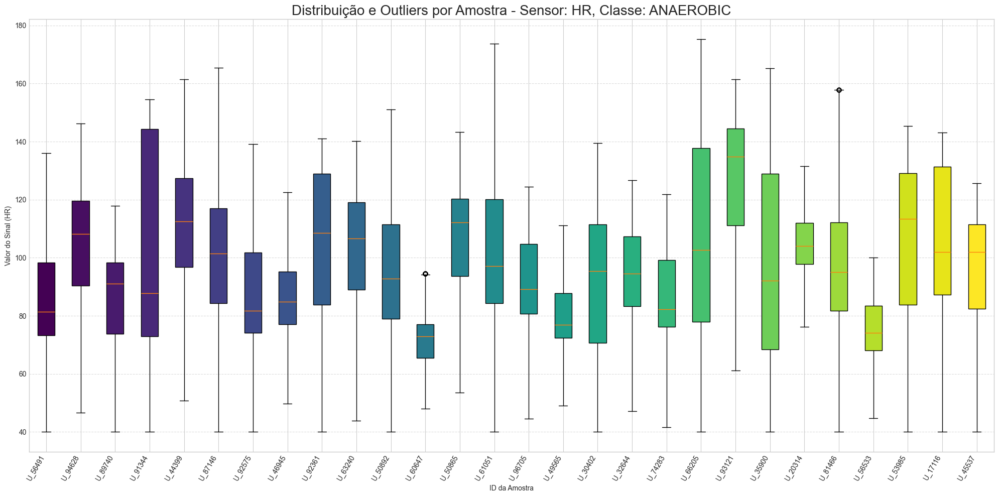


28 box plots gerados para a classe 'ANAEROBIC'.
Coletando dados do sensor 'EDA.csv' para 25 amostras da classe 'STRESS'...
Figura salva em 'figs/boxplots/EDA_stress_boxplots.png'


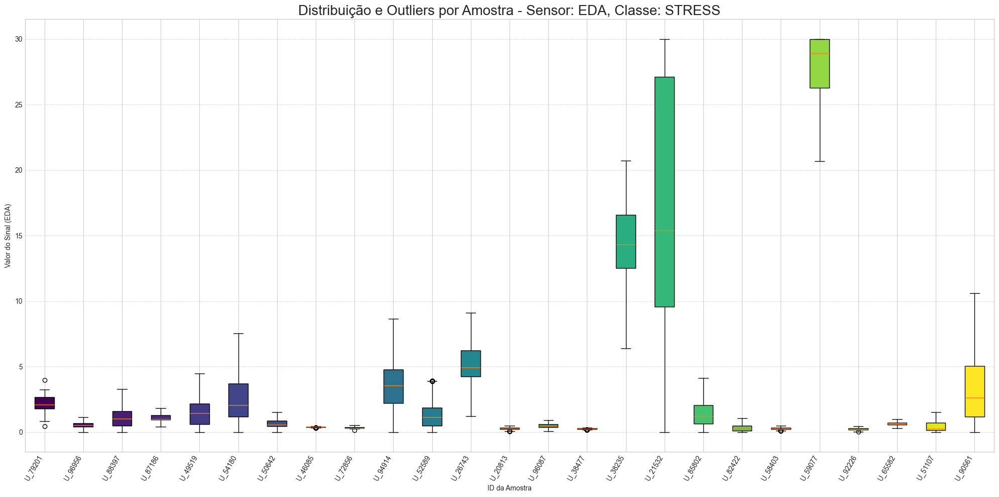


25 box plots gerados para a classe 'STRESS'.
Coletando dados do sensor 'EDA.csv' para 22 amostras da classe 'AEROBIC'...
Figura salva em 'figs/boxplots/EDA_aerobic_boxplots.png'


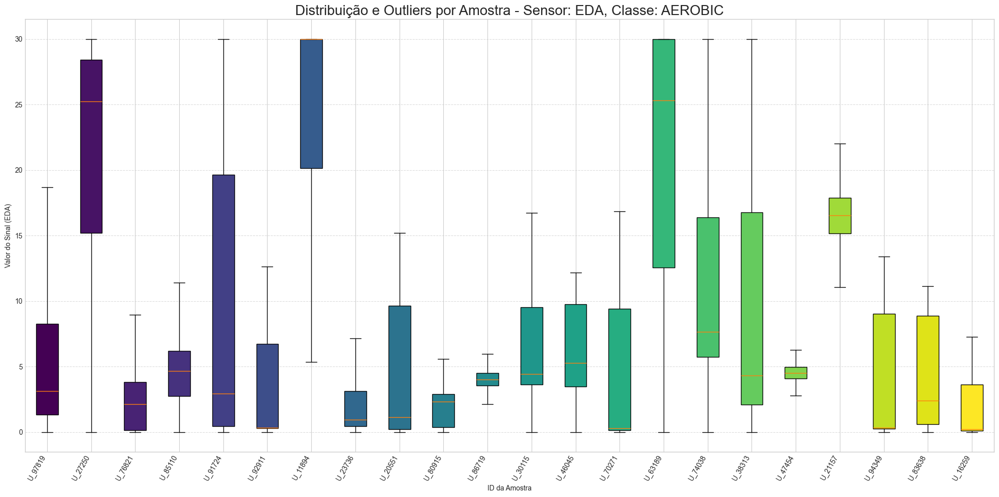


22 box plots gerados para a classe 'AEROBIC'.
Coletando dados do sensor 'EDA.csv' para 28 amostras da classe 'ANAEROBIC'...
Figura salva em 'figs/boxplots/EDA_anaerobic_boxplots.png'


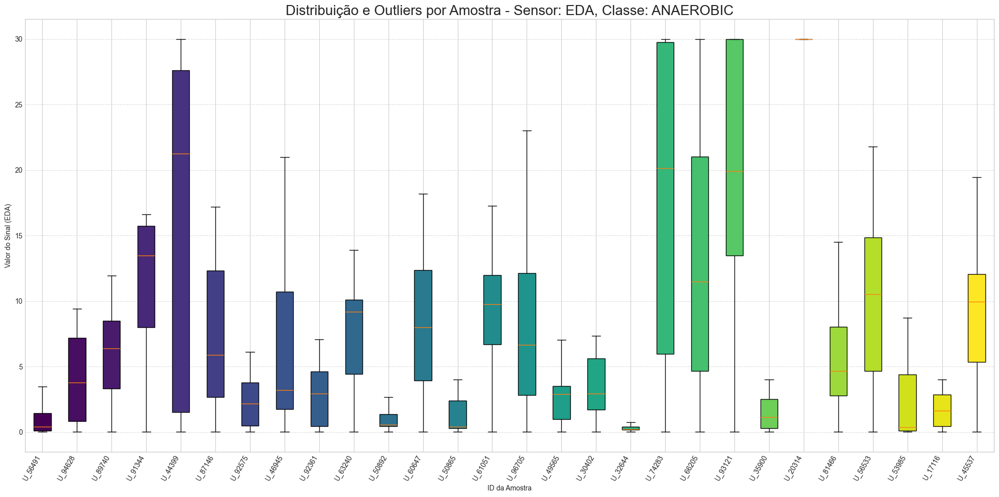


28 box plots gerados para a classe 'ANAEROBIC'.
Coletando dados do sensor 'BVP.csv' para 25 amostras da classe 'STRESS'...
Figura salva em 'figs/boxplots/BVP_stress_boxplots.png'


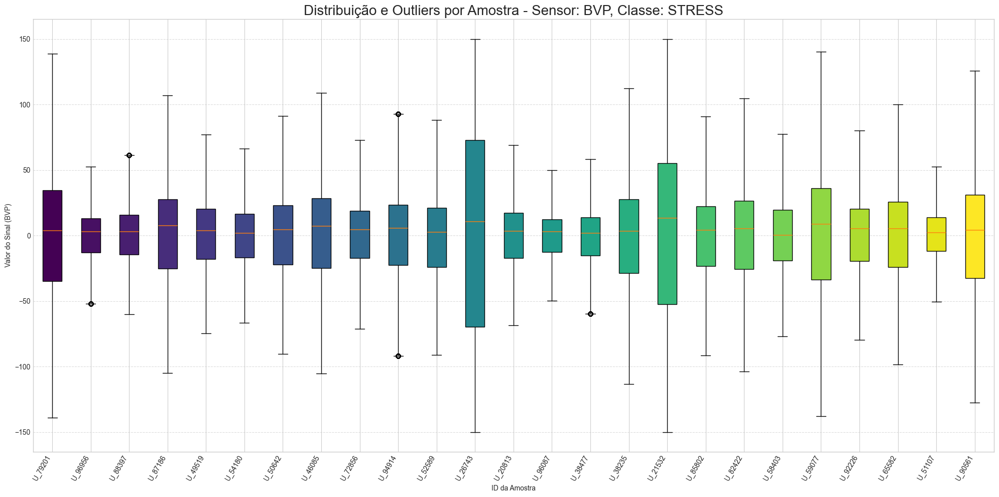


25 box plots gerados para a classe 'STRESS'.
Coletando dados do sensor 'BVP.csv' para 22 amostras da classe 'AEROBIC'...
Figura salva em 'figs/boxplots/BVP_aerobic_boxplots.png'


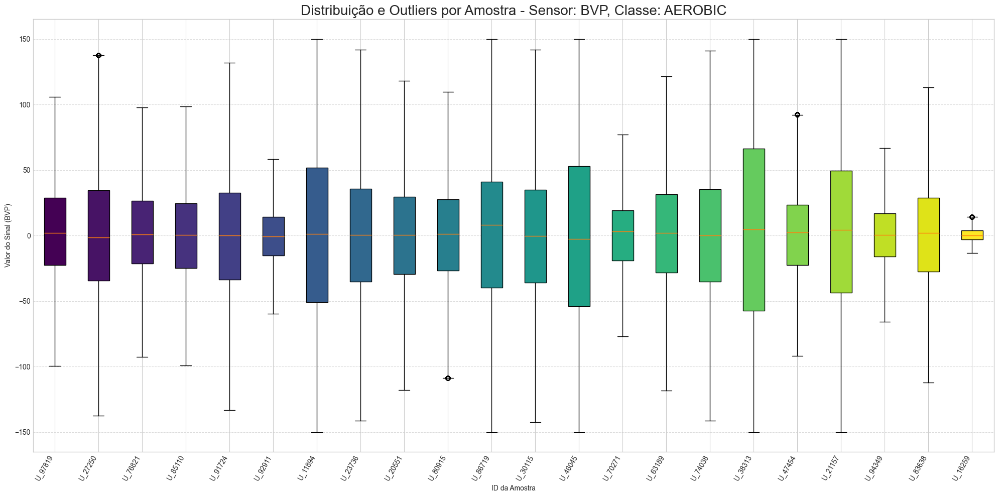


22 box plots gerados para a classe 'AEROBIC'.
Coletando dados do sensor 'BVP.csv' para 28 amostras da classe 'ANAEROBIC'...
Figura salva em 'figs/boxplots/BVP_anaerobic_boxplots.png'


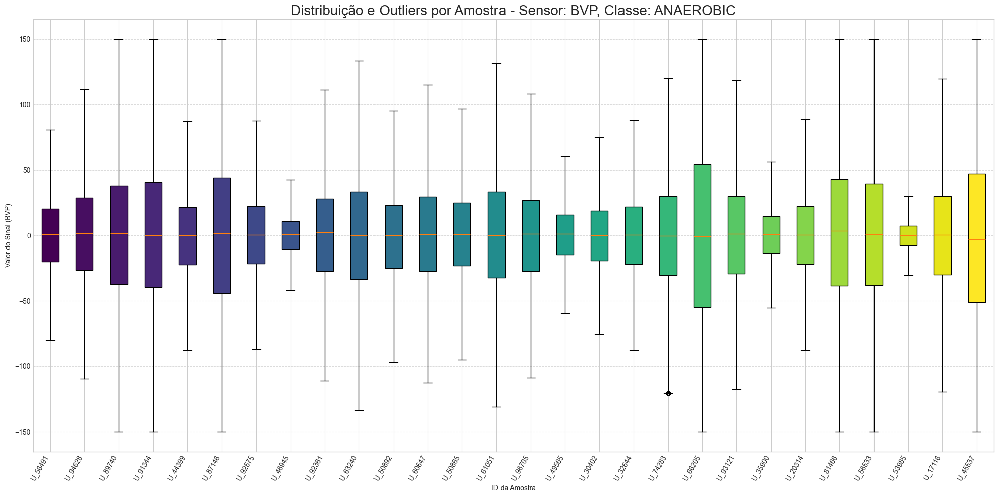


28 box plots gerados para a classe 'ANAEROBIC'.
Coletando dados do sensor 'ACC.csv' para 25 amostras da classe 'STRESS'...
Nenhum dado válido encontrado para o sensor 'ACC.csv' na classe 'STRESS'.
Coletando dados do sensor 'ACC.csv' para 22 amostras da classe 'AEROBIC'...
Nenhum dado válido encontrado para o sensor 'ACC.csv' na classe 'AEROBIC'.
Coletando dados do sensor 'ACC.csv' para 28 amostras da classe 'ANAEROBIC'...
Nenhum dado válido encontrado para o sensor 'ACC.csv' na classe 'ANAEROBIC'.
Coletando dados do sensor 'IBI.csv' para 25 amostras da classe 'STRESS'...
Figura salva em 'figs/boxplots/IBI_stress_boxplots.png'


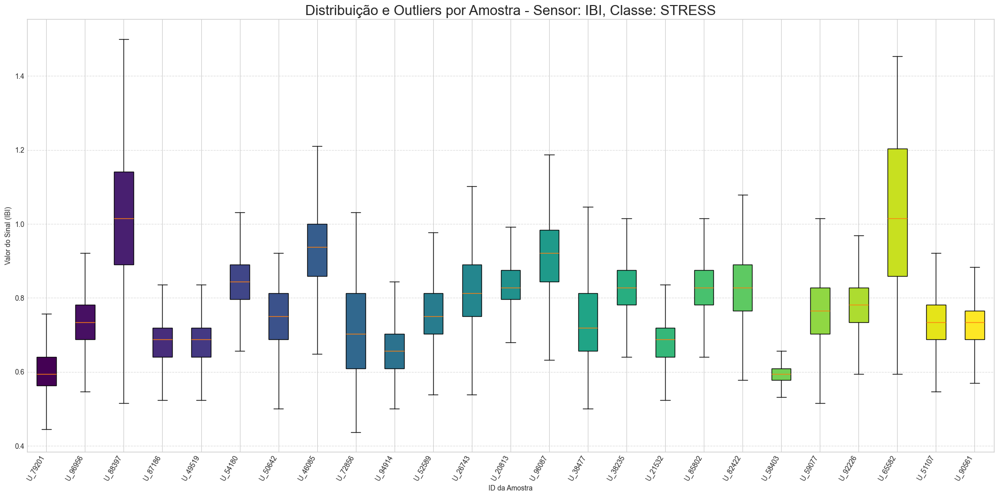


25 box plots gerados para a classe 'STRESS'.
Coletando dados do sensor 'IBI.csv' para 22 amostras da classe 'AEROBIC'...
Figura salva em 'figs/boxplots/IBI_aerobic_boxplots.png'


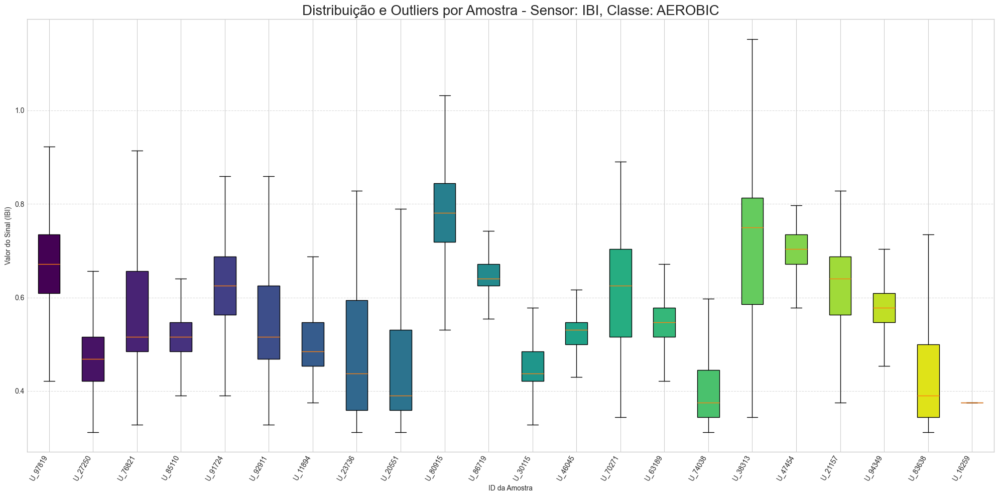


22 box plots gerados para a classe 'AEROBIC'.
Coletando dados do sensor 'IBI.csv' para 28 amostras da classe 'ANAEROBIC'...
Aviso: Não foi possível ler dataset_processed/wearables/U_89740/IBI.csv. Ignorando.
Figura salva em 'figs/boxplots/IBI_anaerobic_boxplots.png'


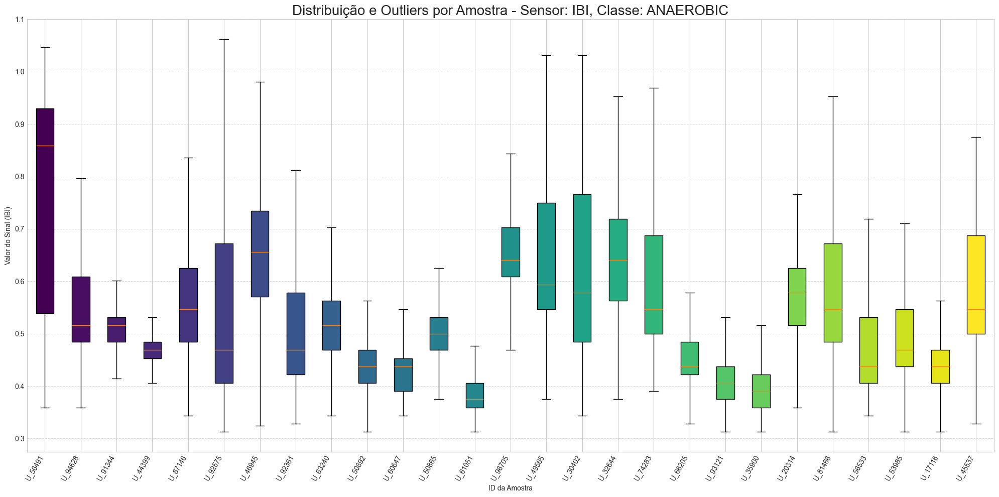


27 box plots gerados para a classe 'ANAEROBIC'.


In [6]:
import pandas as pd
import sys

sys.path.append('scripts')
from analise_exploratoria import plot_boxplot_comparison_for_class

BASE_DIR = 'dataset_processed/wearables'

try:
    df_train = pd.read_csv('dataset/train.csv')
    print("Dataset de treino carregado.")
except FileNotFoundError:
    print("Erro: dataset/train.csv não encontrado. A função não pode ser executada.")
    df_train = None

if df_train is not None:
    ## Plotando medições de TEMP
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='TEMP.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='TEMP.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='TEMP.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    ## Plotando medições de HR
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='HR.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='HR.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='HR.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    ## Plotando medições de EDA
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='EDA.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='EDA.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='EDA.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    ## Plotando medições de BVP
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='BVP.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='BVP.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='BVP.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    ## Plotando medições de ACC
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='ACC.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='ACC.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='ACC.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    ## Plotando medições de IBI
    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='STRESS',
        sensor_name='IBI.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='AEROBIC',
        sensor_name='IBI.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

    plot_boxplot_comparison_for_class(
        dataset=df_train,
        target_class='ANAEROBIC',
        sensor_name='IBI.csv',
        base_dir=BASE_DIR,
        save_fig=True
    )

In [ ]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm

# Bibliotecas do tsfresh
from tsfresh import extract_features, select_features
from tsfresh.utilities.dataframe_functions import impute
from tsfresh.feature_extraction import ComprehensiveFCParameters

# --- 1. CARREGAMENTO DOS DADOS JÁ PRÉ-PROCESSADOS ---

# **------ MUDANÇA PRINCIPAL AQUI ------**
# Apontamos o BASE_PATH para o novo diretório com os dados limpos
BASE_PATH = 'dataset_processed/wearables/'
# ------------------------------------

TRAIN_CSV_PATH = 'dataset/train.csv'
df_labels = pd.read_csv(TRAIN_CSV_PATH)

all_sensor_data = []
print("Carregando dados PRÉ-PROCESSADOS para o formato do tsfresh...")
for index, row in tqdm(df_labels.iterrows(), total=len(df_labels)):
    user_id = row['Id']
    for sensor in ['HR', 'EDA', 'TEMP', 'BVP', 'ACC', 'IBI']:
        file_path = os.path.join(BASE_PATH, user_id, f'{sensor}.csv')
        try:
            # A lógica de leitura é a mesma, mas agora lê os arquivos limpos
            skip = 1 if sensor not in ['IBI'] else 0
            df_clean = pd.read_csv(file_path, header=None, skiprows=skip)

            # A função preprocess_sensor_file NÃO é mais necessária aqui, pois já foi aplicada.

            if df_clean is None or df_clean.empty:
                continue

            # A lógica de formatação para o tsfresh continua a mesma
            if sensor == 'ACC':
                # O ACC pré-processado agora tem uma única coluna 'value' (magnitude)
                df_clean.columns = ['value']
                df_clean['kind'] = 'ACC'
                df_clean['Id'] = user_id
                df_clean['time'] = range(len(df_clean))
                all_sensor_data.append(df_clean[['Id', 'time', 'kind', 'value']])
            elif sensor == 'IBI':
                df_clean.columns = ['Timestamp', 'Interval']
                df_formatted = df_clean[['Interval']].copy()
                df_formatted.columns = ['value']
                df_formatted['kind'] = 'IBI'
                df_formatted['Id'] = user_id
                df_formatted['time'] = range(len(df_formatted))
                all_sensor_data.append(df_formatted[['Id', 'time', 'kind', 'value']])
            else: # HR, EDA, TEMP, BVP
                df_clean.columns = ['value']
                df_clean['kind'] = sensor
                df_clean['Id'] = user_id
                df_clean['time'] = range(len(df_clean))
                all_sensor_data.append(df_clean[['Id', 'time', 'kind', 'value']])

        except (FileNotFoundError, pd.errors.EmptyDataError):
            continue

df_long_format = pd.concat(all_sensor_data)
print("Formato de dados para tsfresh criado a partir dos dados limpos.")


# --- 2. EXTRAÇÃO E SELEÇÃO DE FEATURES (Inalterado) ---
print("\nIniciando extração EFICIENTE de features com tsfresh...")
# (O resto do código permanece exatamente o mesmo)
extracted_features = extract_features(df_long_format,
                                      column_id='Id',
                                      column_sort='time',
                                      column_kind='kind',
                                      column_value='value',
                                      default_fc_parameters=ComprehensiveFCParameters(),
                                      n_jobs=1)

print("Extração concluída. Limpando e selecionando as melhores features...")
impute(extracted_features)
y_for_selection = df_labels.set_index('Id')['Label']
extracted_features = extracted_features.loc[extracted_features.index.isin(y_for_selection.index)]
df_final_tsfresh = select_features(extracted_features, y_for_selection.loc[extracted_features.index])
print(f"\nSeleção concluída. De {extracted_features.shape[1]} features, {df_final_tsfresh.shape[1]} foram selecionadas.")


# --- 3. GERAÇÃO DO HEATMAP (Inalterado) ---
print("\nGerando a matriz de correlação...")
# ... (o resto do código do heatmap permanece o mesmo) ...
top_features = df_final_tsfresh.iloc[:, :15]
correlation_matrix = top_features.corr()

plt.figure(figsize=(16, 12))
sns.heatmap(
    correlation_matrix,
    cmap='bwr',
    annot=True,
    fmt='.2f',
    linewidths=.5,
    vmin=-1, vmax=1
)
plt.title('Matriz de Correlação das Características Mais Relevantes (tsfresh)', fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Carregando dados PRÉ-PROCESSADOS para o formato do tsfresh...


100%|██████████| 75/75 [00:01<00:00, 40.12it/s]


Formato de dados para tsfresh criado a partir dos dados limpos.

Iniciando extração EFICIENTE de features com tsfresh...


Feature Extraction:   0%|          | 0/20 [00:00<?, ?it/s]

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Supondo que 'df_final_tsfresh' e 'df_labels' já existem da célula anterior

# Adiciona a coluna 'Label' ao nosso dataframe de características para a plotagem
df_analysis = df_final_tsfresh.copy()
df_analysis['Label'] = df_labels.set_index('Id')['Label']

print("DataFrame para análise está pronto.")
print(f"Número de características selecionadas pelo tsfresh: {len(df_analysis.columns) - 1}")
print("Exemplo de algumas características:")
display(df_analysis.head())

DataFrame para análise está pronto.
Número de características selecionadas pelo tsfresh: 1074
Exemplo de algumas características:


,ACC__number_peaks__n_10,ACC__number_peaks__n_5,ACC__number_peaks__n_3,ACC__absolute_sum_of_changes,ACC__number_peaks__n_1,"ACC__agg_linear_trend__attr_""slope""__chunk_len_5__f_agg_""max""","ACC__fft_aggregated__aggtype_""kurtosis""","ACC__agg_linear_trend__attr_""slope""__chunk_len_50__f_agg_""var""","ACC__agg_linear_trend__attr_""slope""__chunk_len_5__f_agg_""var""","ACC__agg_linear_trend__attr_""slope""__chunk_len_10__f_agg_""var""",...,"HR__change_quantiles__f_agg_""mean""__isabs_False__qh_0.4__ql_0.0","ACC__agg_linear_trend__attr_""stderr""__chunk_len_50__f_agg_""min""",HR__percentage_of_reoccurring_datapoints_to_all_datapoints,"HR__change_quantiles__f_agg_""var""__isabs_True__qh_0.4__ql_0.0",HR__permutation_entropy__dimension_6__tau_1,"TEMP__change_quantiles__f_agg_""mean""__isabs_True__qh_1.0__ql_0.0",TEMP__mean_abs_change,EDA__mean_second_derivative_central,HR__has_duplicate_max,Label
U_11894,2325.0,4641.0,7281.0,105734.622022,17947.0,0.000108,6.050265,0.004096,0.000171,0.000538,...,0.050257,0.000086,0.489239,0.182868,1.541789,0.003389,0.003389,0.000000,1.0,AEROBIC
U_16259,2254.0,5079.0,9382.0,167981.559925,19365.0,0.000071,8.465635,0.002250,0.000177,0.000413,...,0.001306,0.000083,0.626396,0.039505,1.910518,0.003881,0.003881,0.000198,1.0,AEROBIC
U_17116,1400.0,2883.0,4611.0,167455.189425,9767.0,-0.000505,8.390251,-0.037558,-0.002565,-0.006984,...,0.090473,0.000388,0.400554,1.491453,2.027884,0.004242,0.004242,0.000361,0.0,ANAEROBIC
U_20314,1192.0,2548.0,4162.0,55415.377257,10106.0,0.000031,5.102885,-0.000774,-0.000063,-0.000152,...,0.039687,0.000141,0.395204,0.062327,1.612067,0.007201,0.007201,0.000000,0.0,ANAEROBIC
U_20551,2654.0,5819.0,8797.0,208261.155172,20648.0,0.000076,7.893412,0.004086,0.000206,0.000596,...,0.030009,0.000093,0.531227,0.424310,1.824921,0.005704,0.005704,0.000185,1.0,AEROBIC


In [40]:
from sklearn.feature_selection import f_classif

# Separa X e y para o teste estatístico
X_features = df_analysis.drop('Label', axis=1)
y_labels = df_analysis['Label']

# Calcula o F-value para cada característica. Quanto maior, mais diferente é a média entre as classes.
f_values, p_values = f_classif(X_features, y_labels)

# Cria um DataFrame para visualizar a importância
feature_importance = pd.DataFrame({'Feature': X_features.columns, 'F-value': f_values})
feature_importance = feature_importance.sort_values(by='F-value', ascending=False)

# Seleciona as 6 características com maior F-value para a visualização
top_features_to_plot = feature_importance['Feature'].head(100).tolist()

print("As 20 características mais promissoras para diferenciar as classes são:")
print(top_features_to_plot)

As 20 características mais promissoras para diferenciar as classes são:
['ACC__permutation_entropy__dimension_3__tau_1', 'ACC__permutation_entropy__dimension_7__tau_1', 'ACC__permutation_entropy__dimension_4__tau_1', 'ACC__lempel_ziv_complexity__bins_100', 'ACC__permutation_entropy__dimension_6__tau_1', 'ACC__permutation_entropy__dimension_5__tau_1', 'ACC__change_quantiles__f_agg_"mean"__isabs_True__qh_0.8__ql_0.2', 'ACC__mean_abs_change', 'ACC__change_quantiles__f_agg_"mean"__isabs_True__qh_1.0__ql_0.0', 'ACC__change_quantiles__f_agg_"mean"__isabs_True__qh_0.8__ql_0.0', 'ACC__change_quantiles__f_agg_"mean"__isabs_True__qh_0.6__ql_0.0', 'IBI__quantile__q_0.1', 'ACC__change_quantiles__f_agg_"mean"__isabs_True__qh_1.0__ql_0.2', 'IBI__minimum', 'ACC__change_quantiles__f_agg_"mean"__isabs_True__qh_0.6__ql_0.2', 'ACC__change_quantiles__f_agg_"mean"__isabs_True__qh_0.8__ql_0.4', 'IBI__quantile__q_0.2', 'ACC__change_quantiles__f_agg_"mean"__isabs_True__qh_0.4__ql_0.0', 'ACC__change_quantiles_

ValueError: num must be an integer with 1 <= num <= 20, not 21

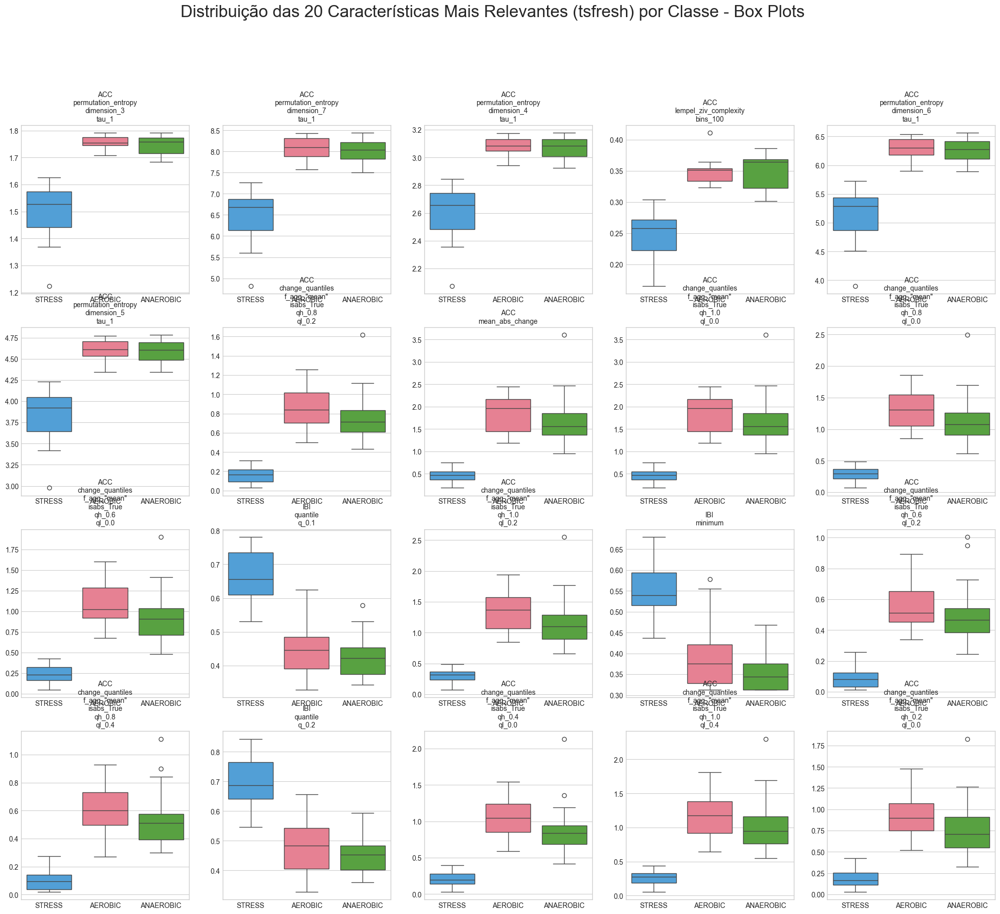

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- 3.3.3 (Alternativa): Comparação com Box Plots ---

plt.figure(figsize=(25, 20))
plt.suptitle('Distribuição das 20 Características Mais Relevantes (tsfresh) por Classe - Box Plots', fontsize=24, y=1.0)

for i, feature in enumerate(top_features_to_plot):
    plt.subplot(4, 5, i + 1)

    # **------ MUDANÇA PRINCIPAL AQUI ------**
    # Trocamos violinplot por boxplot. A sintaxe é a mesma.
    sns.boxplot(
        x='Label',
        y=feature,
        data=df_analysis,
        palette='husl',
        order=['STRESS', 'AEROBIC', 'ANAEROBIC'],
        hue='Label',
        legend=False
    )
    # **-------------------------------------**

    title = feature.replace('__', '\n')
    plt.title(title, fontsize=10)
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

As 100 características mais promissoras para diferenciar as classes foram selecionadas.


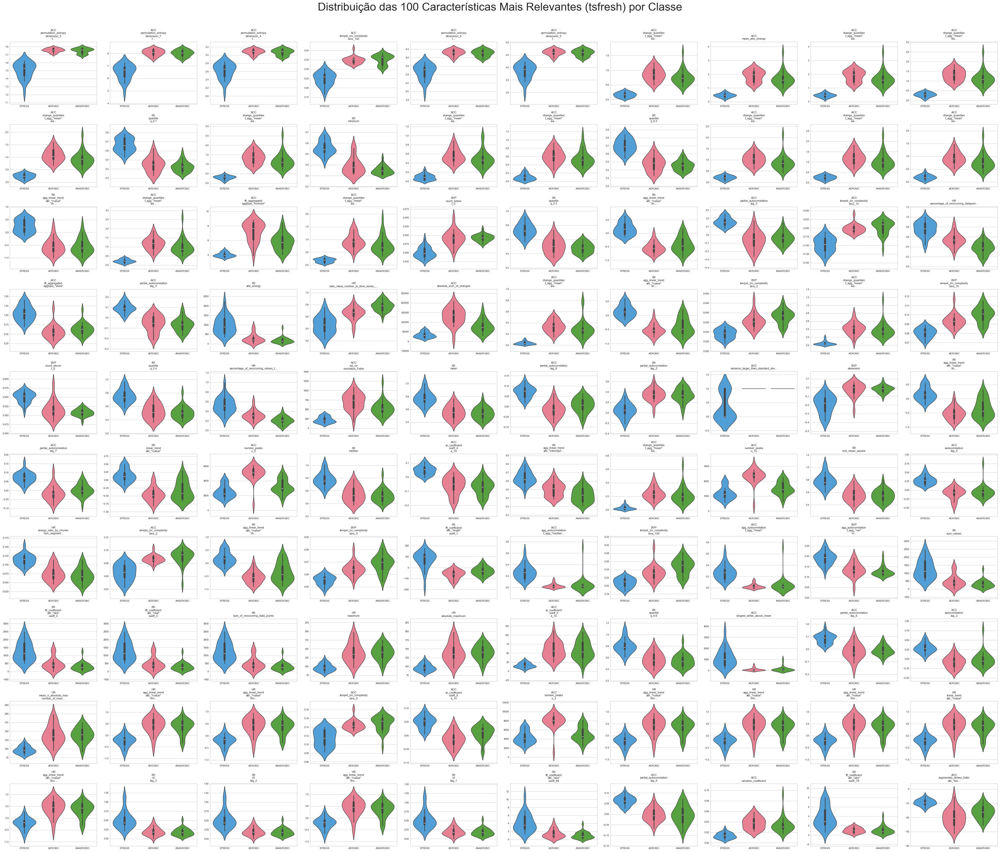

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import f_classif

# --- 1. Identificando as 100 Características Mais Promissoras ---

# Este código assume que 'df_analysis' foi criado em uma célula anterior.

# Separa X e y para o teste estatístico
X_features = df_analysis.drop('Label', axis=1)
y_labels = df_analysis['Label']

# Calcula o F-value para cada característica
f_values, p_values = f_classif(X_features, y_labels)

# Cria um DataFrame para visualizar a importância
feature_importance = pd.DataFrame({'Feature': X_features.columns, 'F-value': f_values})
feature_importance = feature_importance.sort_values(by='F-value', ascending=False)

# **------ MUDANÇA 1: Selecionar as 100 melhores características ------**
# Garante que não tentaremos plotar mais features do que temos disponíveis
num_features_to_plot = min(100, len(X_features.columns))
top_features_to_plot = feature_importance['Feature'].head(num_features_to_plot).tolist()

print(f"As {num_features_to_plot} características mais promissoras para diferenciar as classes foram selecionadas.")


# --- 2. Comparação das Distribuições por Classe (Violin Plots) ---

# **------ MUDANÇA 2: Ajustar o tamanho da figura para a nova grade ------**
# Aumentamos muito o tamanho para acomodar uma grade 10x10
plt.figure(figsize=(40, 35))
plt.suptitle(f'Distribuição das {num_features_to_plot} Características Mais Relevantes (tsfresh) por Classe', fontsize=32, y=1.0)

# Itera pelas 100 melhores características para criar um subplot para cada uma
for i, feature in enumerate(top_features_to_plot):
    # **------ MUDANÇA 3: Ajustar a grade de subplots para 10x10 ------**
    plt.subplot(10, 10, i + 1)

    # Desenha o violin plot
    sns.violinplot(
        x='Label',
        y=feature,
        data=df_analysis,
        palette='husl',
        order=['STRESS', 'AEROBIC', 'ANAEROBIC'],
        hue='Label',
        legend=False
    )

    # Formata o título para ser mais curto e legível
    # Quebra em nova linha e limita o comprimento total
    title = feature.replace('__', '\n')
    if len(title) > 40: # Se o título for muito longo, encurta
        title = title[:37] + '...'
    plt.title(title, fontsize=8) # Reduzimos a fonte drasticamente

    plt.xlabel('')
    plt.ylabel('')
    plt.xticks(fontsize=7) # Reduz a fonte dos ticks do eixo X
    plt.yticks(fontsize=7) # Reduz a fonte dos ticks do eixo Y

# Ajusta o layout para evitar sobreposição
plt.tight_layout(rect=[0, 0.03, 1, 0.99])
plt.show()

Características selecionadas para o Pairplot: ['IBI__minimum', 'IBI__mean', 'IBI__median', 'IBI__root_mean_square', 'IBI__sum_values', 'HR__maximum', 'HR__absolute_maximum', 'BVP__median', 'ACC__standard_deviation', 'HR__standard_deviation']

Gerando Pairplot... (Isso pode levar um minuto)


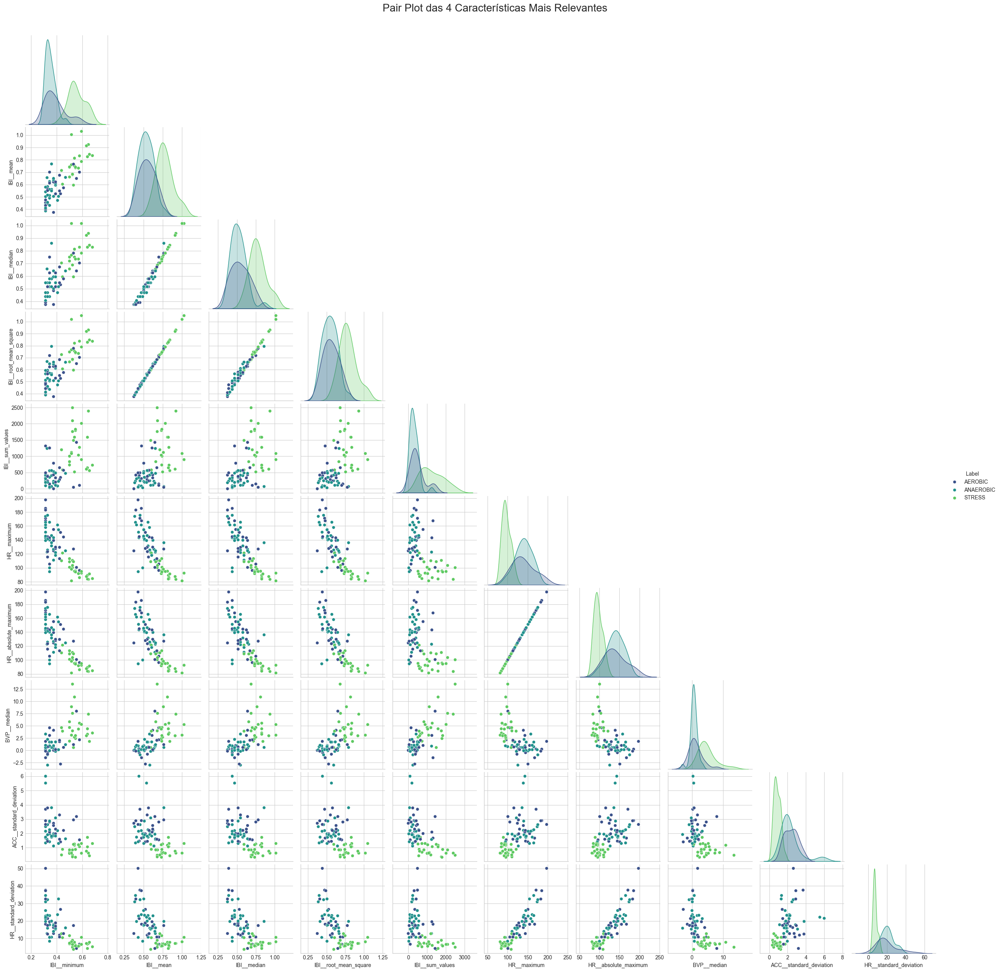

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import f_classif

# Garante que o df_analysis está pronto (executado em seções anteriores)
df_analysis = df_final_tsfresh.copy()
df_analysis['Label'] = df_labels.set_index('Id')['Label']
# --- Identificando as 4 Características Mais Promissoras para o Pairplot ---
# (Repetimos este passo para garantir que a variável 'top_features_to_plot' esteja definida)
X_features = df_analysis.drop('Label', axis=1)
y_labels = df_analysis['Label']
f_values, p_values = f_classif(X_features, y_labels)
feature_importance = pd.DataFrame({'Feature': X_features.columns, 'F-value': f_values})
feature_importance = feature_importance.sort_values(by='F-value', ascending=False)

# Escolhemos um número pequeno de features (4 ou 5) para que o pairplot seja legível
top_features_for_pairplot = feature_importance['Feature'].head(10).tolist()
print("Características selecionadas para o Pairplot:", top_features_for_pairplot)

# --- Gerando o Pairplot ---
print("\nGerando Pairplot... (Isso pode levar um minuto)")

# Adiciona a coluna 'Label' de volta para o 'hue'
df_pairplot = df_analysis[top_features_for_pairplot + ['Label']]

sns.pairplot(df_pairplot, hue='Label', palette='viridis', corner=True)
plt.suptitle('Pair Plot das 4 Características Mais Relevantes', size=20, y=1.02)
plt.show()

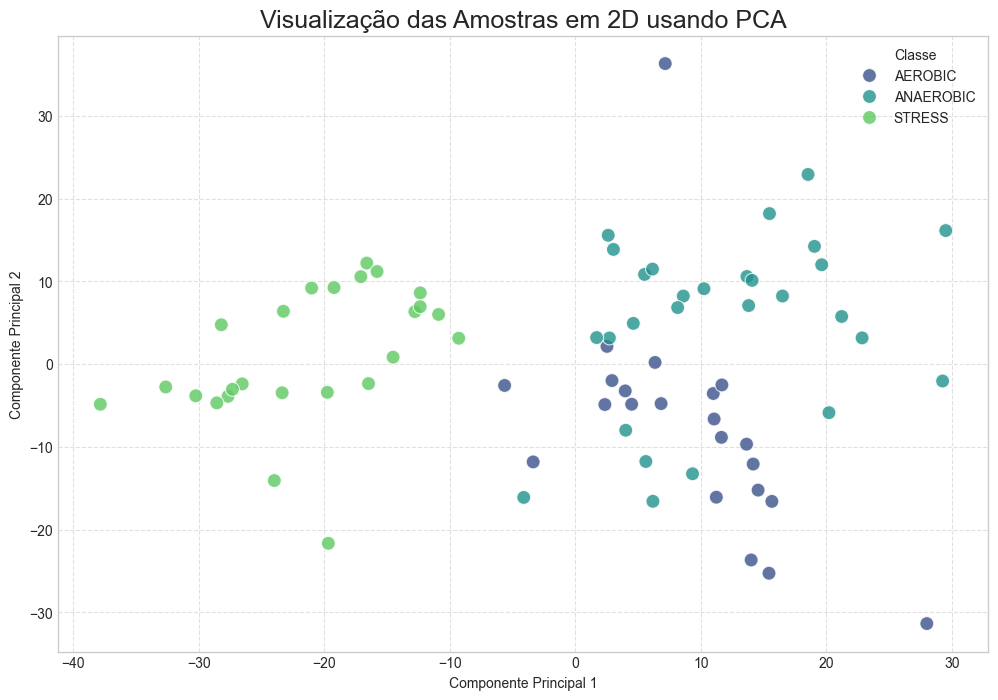

Variância explicada pelos 2 componentes principais: 39.06%


In [41]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# --- Prepara os dados para o PCA ---
# 'X_features' já contém as características do tsfresh
# 'y_labels' já contém os rótulos de texto

# 1. Escalar os dados é OBRIGATÓRIO para o PCA funcionar corretamente
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_features)

# 2. Aplicar o PCA para reduzir para 2 componentes
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# 3. Criar um DataFrame com os resultados para facilitar a plotagem
df_pca = pd.DataFrame(data=X_pca, columns=['Componente Principal 1', 'Componente Principal 2'])
df_pca['Label'] = y_labels.values

# 4. Plotar o gráfico de dispersão do PCA
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='Componente Principal 1',
    y='Componente Principal 2',
    hue='Label',
    data=df_pca,
    palette='viridis',
    s=100,  # Tamanho dos pontos
    alpha=0.8
)
plt.title('Visualização das Amostras em 2D usando PCA', fontsize=18)
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title='Classe')
plt.show()

# Opcional: Ver quanto da informação os 2 componentes capturaram
print(f"Variância explicada pelos 2 componentes principais: {pca.explained_variance_ratio_.sum():.2%}")

---
### Experimento

Nesta seção, o experimento deve ser conduzido, utilizando os protocolos experimentais padrões e testando diferentes modelos.

In [42]:
import pandas as pd
import numpy as np

def preprocess_user_info(file_path: str):
    """
    Carrega, limpa e pré-processa o arquivo de informações demográficas (users_info.txt).
    """
    try:
        df = pd.read_csv(file_path, na_values='-', skipfooter=10, engine='python')
    except FileNotFoundError:
        print(f"Erro: Arquivo '{file_path}' não encontrado.")
        return None

    for col in df.columns:
        if df[col].isnull().any():
            if pd.api.types.is_numeric_dtype(df[col]):
                mean_val = df[col].mean()
                df[col] = df[col].fillna(mean_val)
            else:
                mode_val = df[col].mode()[0]
                df[col] = df[col].fillna(mode_val)

    if 'Does physical activity regularly?' in df.columns:
        df['activity_regularly'] = df['Does physical activity regularly?'].map({'Yes': 1, 'No': 0})
        df.drop(columns=['Does physical activity regularly?'], inplace=True)

    categorical_cols = ['Gender', 'Protocol']
    df = pd.get_dummies(df, columns=categorical_cols, drop_first=True, dtype=int)

    cols_to_drop = ['Stress Inducement', 'Aerobic Exercise', 'Anaerobic Exercise']
    df.drop(columns=cols_to_drop, inplace=True, errors='ignore')

    return df

# --- Executa o pré-processamento ---
USERS_INFO_PATH = 'dataset/users_info.txt'
df_users_processed = preprocess_user_info(USERS_INFO_PATH)

if df_users_processed is not None:
    print("Dados demográficos pré-processados e prontos para serem usados.")
    display(df_users_processed.head())

Dados demográficos pré-processados e prontos para serem usados.


,Id,Age,Height (cm),Weight (kg),activity_regularly,Gender_m,Protocol_V2
0,U_21920,22.000000,173.000000,78.000000,1,1,0
1,U_27250,20.000000,185.000000,95.000000,0,1,0
2,U_82422,22.329787,171.712766,69.617021,1,0,1
3,U_35900,21.000000,175.000000,65.000000,1,1,0
4,U_30402,21.000000,174.000000,70.000000,1,1,0


In [44]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Importa todos os classificadores necessários
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
# --- NOVOS IMPORTS ---
import xgboost as xgb
import lightgbm as lgb
# ---------------------

# --- 1. PREPARAÇÃO FINAL DOS DADOS (COM A JUNÇÃO) ---
df_sensor_features = df_final_tsfresh.reset_index().rename(columns={'index': 'Id'})
df_full_features = pd.merge(df_sensor_features, df_users_processed, on='Id')
print("Características dos sensores e demográficas foram unidas com sucesso.")
print(f"Dimensões do novo DataFrame de características: {df_full_features.shape}")

y_labels = df_labels.set_index('Id').loc[df_full_features['Id']]['Label']
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y_labels)

X = df_full_features.drop(columns=['Id'])
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print(f"\nDados prontos. Temos {X_scaled.shape[0]} amostras e {X_scaled.shape[1]} características.")
print("-" * 50)

model_scores = {}

# --- 2. TESTE E OTIMIZAÇÃO DE CADA MODELO ---

# --- Modelo 1: k-NN ---
print("\nIniciando otimização para k-Nearest Neighbors (k-NN)...")
param_grid_knn = {'n_neighbors': [3, 5, 7, 9, 11], 'weights': ['uniform', 'distance'], 'p': [1, 2]}
grid_knn = GridSearchCV(KNeighborsClassifier(), param_grid_knn, cv=5, scoring='accuracy', n_jobs=1)
grid_knn.fit(X_scaled, y)
model_scores['k-NN'] = {'score': grid_knn.best_score_, 'params': grid_knn.best_params_}
print(f"k-NN Concluído. Melhor Acurácia: {grid_knn.best_score_:.2%}")
print("-" * 50)

# --- Modelo 2: Gaussian Naïve Bayes ---
print("\nIniciando otimização para Gaussian Naïve Bayes...")
param_grid_nb = {'var_smoothing': np.logspace(0, -9, num=100)}
grid_nb = GridSearchCV(GaussianNB(), param_grid_nb, cv=5, scoring='accuracy', n_jobs=1)
grid_nb.fit(X_scaled, y)
model_scores['Naïve Bayes'] = {'score': grid_nb.best_score_, 'params': grid_nb.best_params_}
print(f"Naïve Bayes Concluído. Melhor Acurácia: {grid_nb.best_score_:.2%}")
print("-" * 50)

# --- Modelo 3: Regressão Logística ---
print("\nIniciando otimização para Regressão Logística...")
param_grid_lr = {'C': [0.01, 0.1, 1, 10, 100], 'penalty': ['l2'], 'solver': ['liblinear', 'lbfgs']}
grid_lr = GridSearchCV(LogisticRegression(random_state=42, max_iter=1000), param_grid_lr, cv=5, scoring='accuracy', n_jobs=1)
grid_lr.fit(X_scaled, y)
model_scores['Logistic Regression'] = {'score': grid_lr.best_score_, 'params': grid_lr.best_params_}
print(f"Regressão Logística Concluída. Melhor Acurácia: {grid_lr.best_score_:.2%}")
print("-" * 50)

# --- Modelo 4: Redes Neurais (MLP) ---
print("\nIniciando otimização para Redes Neurais (MLP)...")
param_grid_mlp = {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'alpha': [0.0001, 0.001, 0.01], 'learning_rate_init': [0.001, 0.01]}
grid_mlp = GridSearchCV(MLPClassifier(random_state=42, max_iter=1000), param_grid_mlp, cv=5, scoring='accuracy', n_jobs=1)
grid_mlp.fit(X_scaled, y)
model_scores['Neural Network (MLP)'] = {'score': grid_mlp.best_score_, 'params': grid_mlp.best_params_}
print(f"Redes Neurais Concluída. Melhor Acurácia: {grid_mlp.best_score_:.2%}")
print("-" * 50)

# --- Modelo 5: SVM ---
print("\nIniciando otimização para Support Vector Machine (SVM)...")
param_grid_svm = [{'C': [0.1, 1, 10, 100], 'kernel': ['linear']}, {'C': [1, 10, 100, 1000], 'kernel': ['rbf'], 'gamma': [0.1, 0.01, 0.001, 'scale']}]
grid_svm = GridSearchCV(SVC(probability=True, random_state=42), param_grid_svm, cv=5, scoring='accuracy', n_jobs=1)
grid_svm.fit(X_scaled, y)
model_scores['SVM'] = {'score': grid_svm.best_score_, 'params': grid_svm.best_params_}
print(f"SVM Concluído. Melhor Acurácia: {grid_svm.best_score_:.2%}")
print("-" * 50)

# **------ NOVOS MODELOS ADICIONADOS AQUI ------**

# --- Modelo 6: XGBoost ---
print("\nIniciando otimização para XGBoost...")
param_grid_xgb = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 5],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}
grid_xgb = GridSearchCV(
    estimator=xgb.XGBClassifier(objective='multi:softprob', eval_metric='mlogloss', random_state=42),
    param_grid=param_grid_xgb, cv=5, scoring='accuracy', n_jobs=1, verbose=0 # Verbose=0 para não poluir a saída
)
grid_xgb.fit(X_scaled, y)
model_scores['XGBoost'] = {'score': grid_xgb.best_score_, 'params': grid_xgb.best_params_}
print(f"XGBoost Concluído. Melhor Acurácia: {grid_xgb.best_score_:.2%}")
print("-" * 50)

# --- Modelo 7: LightGBM ---
print("\nIniciando otimização para LightGBM...")
param_grid_lgbm = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1],
    'num_leaves': [21, 31, 41],
    'max_depth': [-1, 5, 10]
}
grid_lgbm = GridSearchCV(
    estimator=lgb.LGBMClassifier(objective='multiclass', random_state=42, verbosity=1),
    param_grid=param_grid_lgbm, cv=5, scoring='accuracy', n_jobs=1, verbose=0
)
grid_lgbm.fit(X_scaled, y)
model_scores['LightGBM'] = {'score': grid_lgbm.best_score_, 'params': grid_lgbm.best_params_}
print(f"LightGBM Concluído. Melhor Acurácia: {grid_lgbm.best_score_:.2%}")
print("-" * 50)

# -----------------------------------------------

# --- 3. SUMÁRIO FINAL E CONCLUSÃO ---
print("\n\n--- SUMÁRIO DE DESEMPENHO DOS 7 MODELOS (COM DADOS DEMOGRÁFICOS) ---")
sorted_models = sorted(model_scores.items(), key=lambda item: item[1]['score'], reverse=True)
for model_name, results in sorted_models:
    print(f"Modelo: {model_name}")
    print(f"  Melhor Acurácia: {results['score']:.2%}")
    print(f"  Melhores Parâmetros: {results['params']}")
    print("-" * 30)

# Não se esqueça de adicionar o gráfico de comparação em uma célula seguinte!
# best_model_object = globals()[f"grid_{sorted_models[0][0].lower().replace(' ', '_').replace('-', '')}"]
print("\nConclusão: O modelo com melhor desempenho na validação cruzada foi o '{}'.".format(sorted_models[0][0]))

Características dos sensores e demográficas foram unidas com sucesso.
Dimensões do novo DataFrame de características: (75, 1081)

Dados prontos. Temos 75 amostras e 1080 características.
--------------------------------------------------

Iniciando otimização para k-Nearest Neighbors (k-NN)...
k-NN Concluído. Melhor Acurácia: 85.33%
--------------------------------------------------

Iniciando otimização para Gaussian Naïve Bayes...
Naïve Bayes Concluído. Melhor Acurácia: 86.67%
--------------------------------------------------

Iniciando otimização para Regressão Logística...
Regressão Logística Concluída. Melhor Acurácia: 86.67%
--------------------------------------------------

Iniciando otimização para Redes Neurais (MLP)...
Redes Neurais Concluída. Melhor Acurácia: 86.67%
--------------------------------------------------

Iniciando otimização para Support Vector Machine (SVM)...
SVM Concluído. Melhor Acurácia: 85.33%
--------------------------------------------------

Iniciando

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22689
[LightGBM] [Info] Number of data points in the train set: 60, number of used features: 1066
[LightGBM] [Info] Start training from score -1.261131
[LightGBM] [Info] Start training from score -0.958850
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22686
[LightGBM] [Info] Number of data points in the train set: 60, number of used features: 1065
[LightGBM] [Info] Start training from score -1.261131
[LightGBM] [Info] Start training from score -0.958850
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22686
[LightGBM] [Info] Number of data points in the train set: 60, number of used features: 1065
[LightGBM] [Info] Start training from score -1.261131
[LightGBM] [Info] Start training from score -0.958850
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Start training from score -1.261131
[LightGBM] [Info] Start training from score -0.958850
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000797 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22686
[LightGBM] [Info] Number of data points in the train set: 60, number of used features: 1065
[LightGBM] [Info] Start training from score -1.261131
[LightGBM] [Info] Start training from score -0.958850
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22711
[LightGBM] [Info] Number of data points in the train set: 60, number of used features: 1066
[LightGBM] [Info] Start training from score -1.203973
[LightGBM] [Info] Start training from score -1.003302
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/Users/andersongoncalves/Documents/SDUWPS/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 27911
[LightGBM] [Info] Number of data points in the train set: 75, number of used features: 1071
[LightGBM] [Info] Start training from score -1.226446
[LightGBM] [Info] Start training from score -0.985284
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

---
### Análise dos Resultados

Nesta seção, os resultados devem ser exibidos através de tabelas e gráficos, comparados e profundamente analisados.